In [4]:
import numpy as np                                      # Numpy for arrays...
import pandas as pd                                     # Pandas for datasets...
from sklearn.base import BaseEstimator, TransformerMixin     # Pipelining...
import matplotlib.pyplot as plt                         # Visualization library...
import seaborn as sns                                   # Visualization library...
import plotly.express as px                             # Visualization library...
from sklearn.pipeline import Pipeline                    # Pipeline for Integrating Pipelines...

    This dataset is from the pre-processed dataset from Weather.ipynb

In [5]:
dataset = pd.read_csv("/content/drive/MyDrive/updated_train_data-2.csv")
dataset.shape

(375734, 45)

In [ ]:
Now we will first extract the Winter Season Months - December, January and February.

    For Multiple Conditions we use | (overloaded operator) with Pandas library.

In [6]:
Winter = dataset[(dataset['Month'] == 12) | (dataset['Month'] == 1) | (dataset['Month'] == 2)]
Winter['Month'].unique()      # Cross checking the Months in the Winter Season...

array([12,  1,  2])

#### Using Pipeline for Nomenclature of dataset columns to make them more understandable and easy to use.

In [7]:
class RenamingWinds(BaseEstimator, TransformerMixin):    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X['Height10'] = X['contest-wind-h10-14d__wind-hgt-10']
        X['Height100'] = X['contest-wind-h100-14d__wind-hgt-100']
        X['Height500'] = X['contest-wind-h500-14d__wind-hgt-500']
        X['Height850'] = X['contest-wind-h850-14d__wind-hgt-850']
        X['LongitudinalWind925'] = X['contest-wind-vwnd-925-14d__wind-vwnd-925']
        X['LongitudinalWind250'] = X['contest-wind-vwnd-250-14d__wind-vwnd-250']
        X['ZonalWind250'] = X['contest-wind-uwnd-250-14d__wind-uwnd-250']
        X['ZonalWind925'] = X['contest-wind-uwnd-925-14d__wind-uwnd-925']
        X = X.drop(['contest-wind-h10-14d__wind-hgt-10', 'contest-wind-h100-14d__wind-hgt-100', 'contest-wind-h500-14d__wind-hgt-500', 'contest-wind-h850-14d__wind-hgt-850', 'contest-wind-vwnd-925-14d__wind-vwnd-925', 'contest-wind-vwnd-250-14d__wind-vwnd-250', 'contest-wind-uwnd-250-14d__wind-uwnd-250', 'contest-wind-uwnd-925-14d__wind-uwnd-925'], axis=1)
        return X

In [8]:
class RenamingTemperatures(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X['Mean0Temperature34w'] = X['nmme0-tmp2m-34w__nmme0mean']    # Most Recent Mean...
        X['Temperature'] = X['contest-tmp2m-14d__tmp2m']
        X['MeanTemperature34w'] = X['nmme-tmp2m-34w__nmmemean']
        X['Nmme0Mean'] = X['nmme0mean']        # NMME Mean...
        X['Evaporation'] = X['contest-pevpr-sfc-gauss-14d__pevpr']
        X['RecentCancmPrate56w'] = X['nmme0-prate-56w__cancm40']    # Cancm40 is taken...
        X['RecentCcsmPrate56w'] = X['nmme0-prate-56w__ccsm30']     # Ccsm30 is taken...
        X['CancmPrate56w'] = X['nmme-prate-56w__cancm4']              # Cancm4...
        X['Ccsm3Prate56w'] = X['nmme-prate-56w__ccsm3']                # Ccsm3...
        X = X.drop(['nmme0-tmp2m-34w__nmme0mean', 'contest-tmp2m-14d__tmp2m', 'nmme0mean', 'nmme-tmp2m-34w__nmmemean', 'contest-pevpr-sfc-gauss-14d__pevpr', 'nmme0-prate-56w__cancm40', 'nmme0-prate-56w__ccsm30', 'nmme-prate-56w__cancm4', 'nmme-prate-56w__ccsm3'], axis=1)
        return X

In [9]:
class RenamingPrecipitation(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X['Humidity'] = X['contest-rhum-sig995-14d__rhum']
        X['SeaLevelPressure'] = X['contest-slp-14d__slp']
        X['Pressure'] = X['contest-pres-sfc-gauss-14d__pres']
        X['AtmosphericPrecipitate'] = X['contest-prwtr-eatm-14d__prwtr']
        X['Precipitation'] = X['contest-precip-14d__precip']
        X['Elevation'] = X['elevation__elevation']
        X['Regions'] = X['climateregions__climateregion']
        X = X.drop(['contest-rhum-sig995-14d__rhum', 'contest-slp-14d__slp', 'contest-pres-sfc-gauss-14d__pres', 'contest-precip-14d__precip', 'elevation__elevation', 'climateregions__climateregion', 'contest-prwtr-eatm-14d__prwtr'], axis=1)
        return X

In [10]:
class ElNinoFactors(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X['ElNinoLongitudinalWind250Mean'] = X['wind-vwnd-250-2010-mean']
        X['ElNinoZonalWind250Mean'] = X['wind-uwnd-250-2010-mean']
        X['ElNinoZonalWind925Mean'] = X['wind-uwnd-925-2010-mean']
        X['ElNinoLongitudinalWind925Mean'] = X['wind-vwnd-925-2010-mean']
        X['GlacierFactorMean'] = X['icec-2010-mean']
        X['ElNinoHeight10Mean'] = X['wind-hgt-10-2010-mean']
        X['ElNinoHeight100Mean'] = X['wind-hgt-100-2010-mean']
        X['ElNinoHeight500Mean'] = X['wind-hgt-500-2010-mean']
        X['ElNinoHeight850Mean'] = X['wind-hgt-850-2010-mean']
        X['ElNinoSeaTemperatureMean'] = X['sst-2010-mean']
        X = X.drop(['wind-vwnd-250-2010-mean', 'wind-uwnd-925-2010-mean', 'wind-uwnd-250-2010-mean', 'wind-vwnd-925-2010-mean', 'icec-2010-mean', 'wind-hgt-850-2010-mean', 'wind-hgt-500-2010-mean', 'wind-hgt-100-2010-mean', 'wind-hgt-10-2010-mean', 'sst-2010-mean'], axis=1)
        return X

In [11]:
class RenamingRatio(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X['MEI'] = X['mei__mei']
        X['MEIrank'] = X['mei__meirank']
        X['MEInip'] = X['mei__nip']
        X['MJOphase'] = X['mjo1d__phase']
        X['MJOamplitude'] = X['mjo1d__amplitude']
        X = X.drop(['mei__mei', 'mei__meirank', 'mei__nip', 'mjo1d__phase', 'mjo1d__amplitude'], axis=1)
        return X

#### Renaming the Columns so that the nomenclature of the datset is more refined and understandable.

In [12]:
RenamingColumnPipe = Pipeline([
    ("RenameI", RenamingWinds()),
    ("RenameII", RenamingTemperatures()),
    ("RenameIII", RenamingPrecipitation()),
    ("RenameIV", ElNinoFactors()),
    ("RenameV", RenamingRatio())
])
Winter = RenamingColumnPipe.fit_transform(Winter)

<ipython-input-7-6f23de1d63e6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Height10'] = X['contest-wind-h10-14d__wind-hgt-10']
<ipython-input-7-6f23de1d63e6>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Height100'] = X['contest-wind-h100-14d__wind-hgt-100']
<ipython-input-7-6f23de1d63e6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyd

In [13]:
class RemovingDate(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.drop(['date', 'Month', 'Year'], axis=1)
        return X

    We will now have a look at the MEI and MJO Attributes.

In [14]:
df = pd.DataFrame()    # Dataframe created for checking the attributes...
df['MEI'] = Winter['MEI']             # Three MEI Attributes...
df['MEIrank'] = Winter['MEIrank']     
df['MEInip'] = Winter['MEInip']
df['MJOphase'] = Winter['MJOphase']   # Two MJO Attributes...
df['MJOamplitude'] = Winter['MJOamplitude']
df['Temperature'] = Winter['Temperature']       # Temperature...

In [15]:
DropTimePipe = Pipeline([
    ("Date", RemovingDate())     # We removed date for now, otherwise it will create discrepancies in Correlation Matrix... 
])

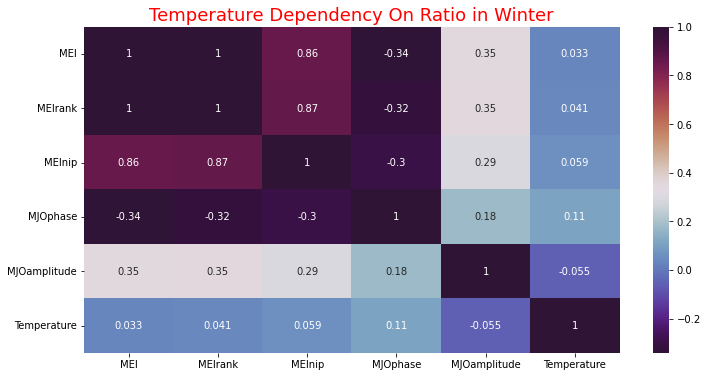

In [16]:
def CorrelationMatrix():
    plt.figure(figsize=(12, 6))
    plt.title("Temperature Dependency On Ratio in Winter", color="red", size=18)
    sns.heatmap(df.corr(), cmap="twilight_shifted", annot=True)
    plt.show()

CorrelationMatrix()    # Correlation matrix function defined and called...

#### Intuitions-
1. Since MEI and MEIrank are well correlated we can exclude one of them, say MEIrank.
2. Also only MJOphase has some degree of correlation to Temperature and MJOamplitude is very less significant, so we should take only one parameter i.e. MJOphase.
3. Also, we will exclude MEInip since it has almost no significance in computation (0.059)

    Now we will check for the correlation factors, firstly the ElNino parameters.

#### First Set Of Correlation Features.

In [17]:
df1 = pd.DataFrame()
df1['Temperature'] = Winter['Temperature']
df1['ElNinoLongitudinalWind250Mean'] = Winter['ElNinoLongitudinalWind250Mean']
df1['ElNinoZonalWind250Mean'] = Winter['ElNinoZonalWind250Mean']
df1['ElNinoZonalWind925Mean'] = Winter['ElNinoZonalWind925Mean']
df1['ElNinoZonalWind925Mean'] = Winter['ElNinoZonalWind925Mean']
df1['ElNinoLongitudinalWind925Mean'] = Winter['ElNinoLongitudinalWind925Mean']
df1['GlacierFactor'] = Winter['GlacierFactorMean']
df1['ElNinoHeight10Mean'] = Winter['ElNinoHeight10Mean']
df1['ElNinoHeight100Mean'] = Winter['ElNinoHeight100Mean']
df1['ElNinoHeight500Mean'] = Winter['ElNinoHeight500Mean']
df1['ElNinoHeight850Mean'] = Winter['ElNinoHeight850Mean']
df1['ElNinoSeaTemperatureMean'] = Winter['ElNinoSeaTemperatureMean']
df1['MJO'] = Winter['MJOphase']
df1['MEI'] = Winter['MEI']

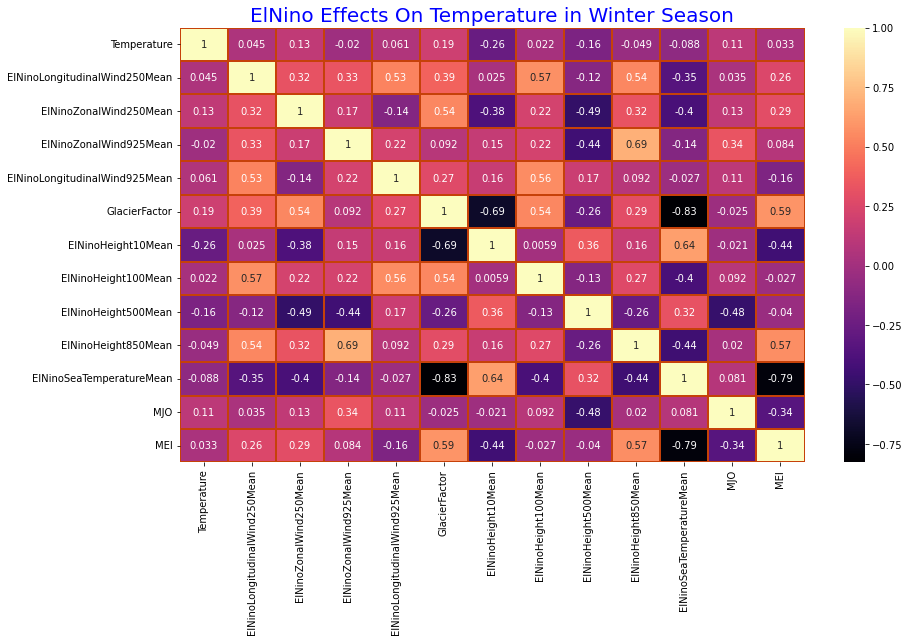

In [18]:
plt.figure(figsize=(14, 8))
plt.title("ElNino Effects On Temperature in Winter Season", color="blue", size=20)
sns.heatmap(df1.corr(), cmap="magma", annot=True, linewidth=1, linecolor="#c64109")
plt.show()

#### Additional Intuitions-
1. There are only a few factors which have some correlation with the Temperature variable, MJOPhase, GlacierFactor, ElNinoZonalWind250Mean, ElNinoHeight10Mean and ElNinoHeight500Mean.
2. The Rest factors have effect less than even 1% ( less than 0.1 coefficient ). Also, all these irrelevant factors are somehow correlated to the relevant ones with a high value of correlation. So we can exclude the irrelevant factors.

#### Second Set of Correlation Features

In [19]:
df2 = pd.DataFrame()
df2['Height10'] = Winter['Height10']
df2['Height100'] = Winter['Height100']
df2['Height500'] = Winter['Height500']
df2['Height850'] = Winter['Height850']
df2['LongitudinalWind925'] = Winter['LongitudinalWind925']
df2['LongitudinalWind250'] = Winter['LongitudinalWind250']
df2['ZonalWind250'] = Winter['ZonalWind250']
df2['ZonalWind925'] = Winter['ZonalWind925']
df2['Mean0Temperature34w'] = Winter['Mean0Temperature34w']
df2['Temperature'] = Winter['Temperature']
df2['MeanTemperature34w'] = Winter['MeanTemperature34w']
df2['Nmme0Mean'] = Winter['Nmme0Mean']

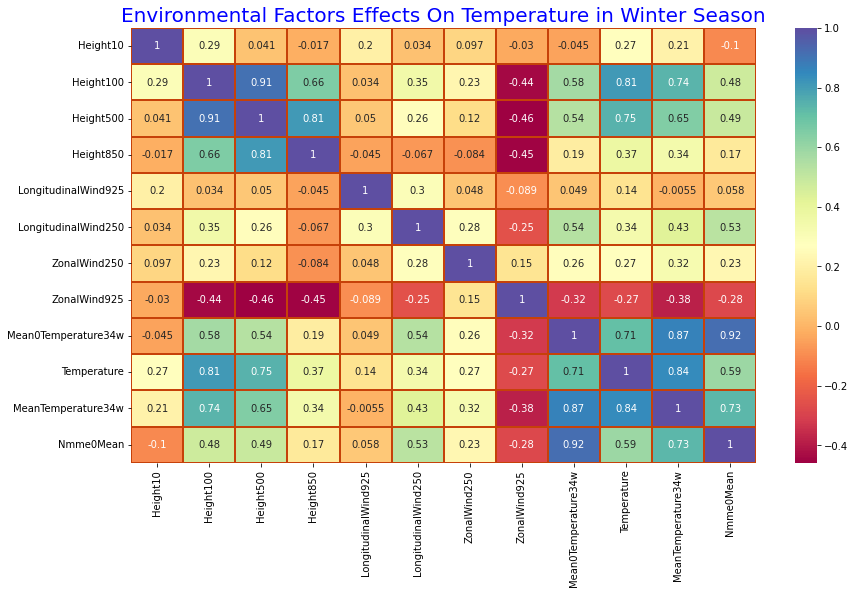

In [20]:
plt.figure(figsize=(14, 8))
plt.title("Environmental Factors Effects On Temperature in Winter Season", color="blue", size=20)
sns.heatmap(df2.corr(), cmap="Spectral", annot=True, linewidth=1, linecolor="#c64109")
plt.show()

#### Additional Intuitions-
1. Height10 and ZonalWind250 have the same correlation value on Temperature (both have a coefficient of 0.27).
2. MeanTemperature34w and Height100 are well correlated to Target Temperature (0.81, 0.84).
3. Height100 and Height500 are well correlated (0.91), so we will remove Height500.
4. MeanTemperature34w and Mean0Temperature34w is well correlated to each other (0.87), so we will remove the Mean0Temperature34w, since it has lower correlation value to Temperature as compared to that of Mean0Temperature34w.

In [21]:
df = pd.DataFrame()
df['Evaporation'] = Winter['Evaporation']
df['RecentCancm'] = Winter['RecentCancmPrate56w']
df['RecentCcsm'] = Winter['RecentCcsmPrate56w']
df['CancmPrate'] = Winter['CancmPrate56w']
df['Ccsm3Prate'] = Winter['Ccsm3Prate56w']
df['Humidity'] = Winter['Humidity']
df['SLP'] = Winter['SeaLevelPressure']
df['Pressure'] = Winter['Pressure']
df['AtmosphericPrecipitate'] = Winter['AtmosphericPrecipitate']
df['Precipitation'] = Winter['Precipitation']
df['Elevation'] = Winter['Elevation']
df['Temperature'] = Winter['Temperature']

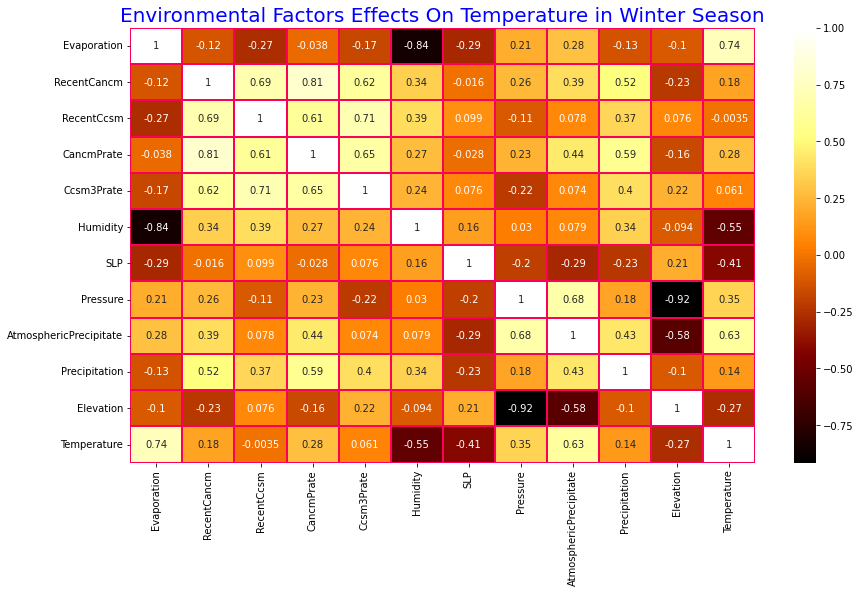

In [22]:
plt.figure(figsize=(14, 8))
plt.title("Environmental Factors Effects On Temperature in Winter Season", color="blue", size=20)
sns.heatmap(df.corr(), cmap="afmhot", annot=True, linewidth=1, linecolor="#fc0059")
plt.show()

#### Additional Intuition-
1. Cancm Attributes show better correlation than Ccsm Attributes with respect to temperature. So we will take the better one, since both are Weather Stations so we can take one of them.
2. Evaporation and AtmosphericPrecipitate are the most significant variables have effect on Temperature (0.74 and 0.63).
3. Since Pressure and Elevation are well correlated we can drop one of them (Elevation). Similarly we can do for Evaporation and Humidity, we will drop Humidity in this case.

In [23]:
class RemoveIrrelevantColumns(BaseEstimator, TransformerMixin):      # Removing the insignificant Columns...
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.drop(['MEIrank', 'MEInip', 'MJOamplitude', 'ElNinoLongitudinalWind250Mean', 'ElNinoLongitudinalWind250Mean', 'ElNinoZonalWind250Mean', 'ElNinoHeight100Mean', 'ElNinoHeight850Mean', 'ElNinoSeaTemperatureMean'], axis=1)
        return X

In [24]:
class RemoveEnvironmentalFactors(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):       # Removing the columns from the Environmental Factors Heatmap...
        return self
    
    def transform(self, X):
        X = X.drop(['ZonalWind250', 'Mean0Temperature34w', 'Height500'], axis=1)
        return X

In [25]:
class RemoveOtherFactors(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.drop(['RecentCcsmPrate56w', 'Ccsm3Prate56w', 'Humidity', 'Elevation'], axis=1)
        return X

    Used the Nested Pipelining property to club various Pipelines created.

In [26]:
Pipe = Pipeline([
    ("DropI", RemoveIrrelevantColumns()),
    ("DropII", RemoveEnvironmentalFactors()),
    ("DropIII", RemoveOtherFactors()),
    ("Pip", DropTimePipe)      # Using Nested Pipe (A Pipe within another Pipe)...
])
WinterSeason = Pipe.fit_transform(Winter)
WinterSeason = WinterSeason.drop(['startdate', 'Regions'], axis=1)
WinterSeason.shape

(93034, 25)

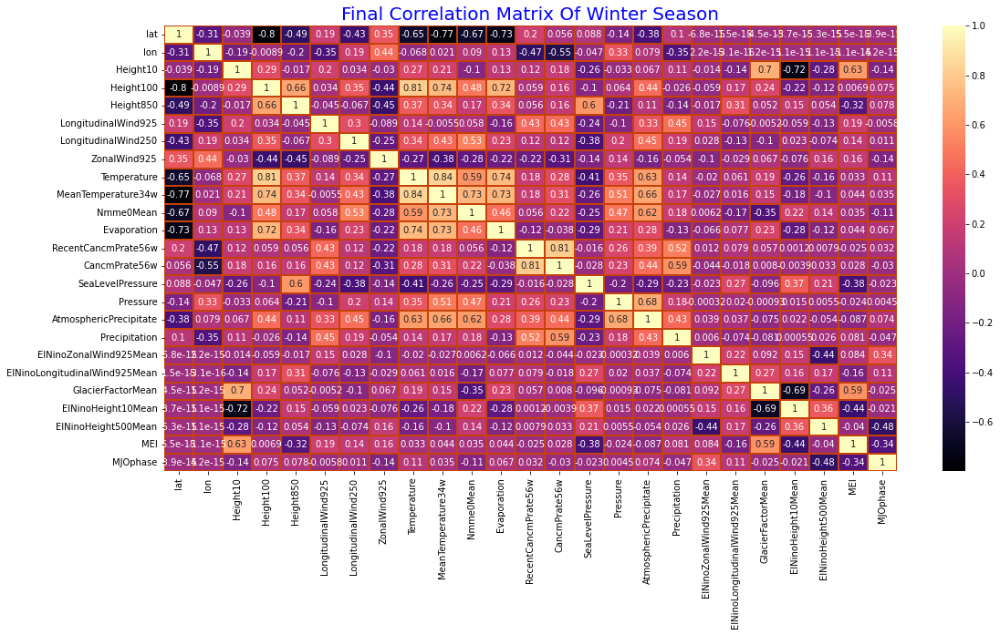

In [27]:
plt.figure(figsize=(18, 9))
plt.title("Final Correlation Matrix Of Winter Season", color="blue", size=20)
sns.heatmap(WinterSeason.corr(), cmap="magma", annot=True, linewidth=1, linecolor="#c64109")
plt.show()

#### Additional Intuitions-
1. ElNinoZonalWind925Mean and ElNinoLongitudinalWind925Mean have almost negligible effect on other factors especially Temperature. So we can exclude both of them from the computation.
2. The Temperature is not dependent upon Longitude but on Latitude. This gives us some hint like the winds are not flowing in Longitudinal Direction but at a Latitudinal Direction in Winters. Thus, we can remove the Longitudinal Winds from the dataset for Winter Season.
3. Evaporation and Atmospheric Precipitate are a big driving force on Temperature in Winters (0.74 and 0.63).
4. Height10 and CancmPrate56w have same effect on Temperature (0.27 and 0.28). So we will exclude the Cancm Precipitation Attributes.
5. Similarly ElNinoHeight10Mean and Height10 are negatively correlated, so we will exclude ElNinoHeight10Mean.

In [28]:
WinterSeason = WinterSeason.drop(['CancmPrate56w', 'RecentCancmPrate56w', 'LongitudinalWind925', 'LongitudinalWind250', 'ElNinoZonalWind925Mean', 'ElNinoLongitudinalWind925Mean', 'ElNinoHeight10Mean'], axis=1)                  # Dropping the insignificant columns...
WinterSeason.shape

(93034, 18)

In [29]:
for columnName in WinterSeason.columns:
    print(columnName)

lat
lon
Height10
Height100
Height850
ZonalWind925
Temperature
MeanTemperature34w
Nmme0Mean
Evaporation
SeaLevelPressure
Pressure
AtmosphericPrecipitate
Precipitation
GlacierFactorMean
ElNinoHeight500Mean
MEI
MJOphase


    Adding the date and the regions again...

In [30]:
WinterSeason['startdate'] = Winter['startdate']
WinterSeason['Regions'] = Winter['Regions']

In [31]:
fig = px.density_contour(WinterSeason, x="Temperature", y="lat", title="Temperature Density Points x Latitude")
fig.update_traces(contours_coloring="fill", contours_showlabels = True, colorscale="viridis")
fig.update_layout(title_font_color="blue", font_color="red", font_size=20, width=1000, height=650)
fig.show()

    The number of Data Points are mostly intensified into two regions as per latitude.

In [32]:
fig = px.density_contour(WinterSeason, x="Temperature", y="lon", title="Temperature Density Points x Longitude")
fig.update_traces(contours_coloring="fill", contours_showlabels = True, colorscale="viridis")
fig.update_layout(title_font_color="blue", font_color="red", font_size=20, width=1000, height=650)
fig.show()

    The Temperature points are not intensified rather they are widespread in the entire region.

In [33]:
import plotly.graph_objects as graph
fig = graph.Figure(data=graph.Violin(y=WinterSeason["Temperature"], box_visible=True, line_color='blue', meanline_visible=True, fillcolor='red', opacity=0.6, points="outliers"))
fig.update_layout(title="Temperature Distribution in Winter Season", title_font_size=24, title_font_color="lightseagreen", font_color="red", font_size=18)
fig.show()

#### Intuition-
1. The Mean and Median lines are pretty close to each other. Thus, the data is very well distributed by the median line. Although, there are some outliers present.

In [34]:
fig = graph.Figure(data=graph.Violin(y=WinterSeason["Temperature"], x=WinterSeason['lat'], box_visible=True, line_color='blue', meanline_visible=True, fillcolor='red', opacity=0.6, points="outliers"))
fig.update_layout(title="Temperature Distribution in Winter Season on Basis Of Latitudes", title_font_size=24, title_font_color="lightseagreen", font_color="red", font_size=18)
fig.show()

#### Additional Intuition-
1. The outliers of Temperature lie within the Latitude range [0.4545, 0.6818]. Other data points do not have outliers data.
2. After latitude 0.4545, the difference or distinction of the mean and median lines become distinct.
3. There are 23 unique latitude points in the Winter Season dataset.
4. The Temperature data for every latitude values is not much dispersed (the Temperature range is less when distributed across latitudes).

In [35]:
fig = graph.Figure(data=graph.Violin(y=WinterSeason["Temperature"], x=WinterSeason['lon'], box_visible=True, line_color='blue', meanline_visible=True, fillcolor='red', opacity=0.6, points="outliers"))
fig.update_layout(title="Temperature Distribution in Winter Season on Basis Of Longitudes", title_font_size=24, title_font_color="lightseagreen", font_color="red", font_size=18)
fig.show()

#### Additional Intuitions-
1. The outliers of Temperature are widespread.
2. After longitude 0.2, the difference or distinction of the mean and median lines become distinct.
3. There are 31 unique latitude points in the Winter Season dataset.
4. The Temperature data for every longitude values is much dispersed (which was not is the case with latitudes).

In [36]:
WinterSeason.shape

(93034, 20)

#### Eradicating the El Nino Temperatures since they do not create much Impact or Trend on Temperature.

In [37]:
WinterSeason = WinterSeason.drop(['GlacierFactorMean', 'ElNinoHeight500Mean'], axis=1)
WinterSeason.shape

(93034, 18)

#### The Final Dataset contains 18 columns which have some relevance to the Temperature factor in the Winter Season.

In [40]:
#WinterSeason.to_csv("E:/Downloads/Winter_season.csv", index=False)
